Author Lingting Shi, from Elham Azizi lab
Functions of this notebook is written by Zicheng Wang from Yufeng Shen lab from https://github.com/princello/TCRB_matching

In [1]:
import numpy as np
import pandas as pd
import anndata
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt
from pathlib import Path

In [2]:
PROJECT_ROOT = Path('../..')

# Input paths
TCR_SEL_ALL_PATH              = PROJECT_ROOT / 'adata_file' / 'tcr_sel_all_unstimulated.csv'
TCELL_ANN_PATH = PROJECT_ROOT / 'adata_file' / 'tcell_ann.h5ad'

# Output paths
TCR_SEL_ALL_MAPPED_PATH       = PROJECT_ROOT / 'adata_file' / 'tcr_sel_all_mapped_unstimulated.csv'
TCELL_ANN_MAPPED_PATH         = PROJECT_ROOT / 'adata_file' / 'tcell_ann_concat_Tcell_only_Migration_mapped_un.h5ad'
FIGURES_DIR                   = PROJECT_ROOT / 'Figures' / 'single_cell_figures'
FIGURES_DIR.mkdir(parents=True, exist_ok=True)
shared_patients = ['C068', 'C101', 'C98', 'C66', 'C86', 'C160', 'C179', 'C155']

# Load in paired data

In [3]:

tcr_sel_all = pd.read_csv(TCR_SEL_ALL_PATH)

# Load in process data and paired with scRNA seq

In [4]:
#load in single cell data
tcell_ann = anndata.read_h5ad(TCELL_ANN_PATH)

In [5]:
tcell_ann.obs.index.unique()

Index(['R096_Tc17_up_AAACCTGCATCCCACT-1', 'R096_Tc17_up_AAACCTGGTTGGAGGT-1',
       'R096_Tc17_up_AAACCTGTCTATCCTA-1', 'R096_Tc17_up_AAACGGGAGGATGCGT-1',
       'R096_Tc17_up_AAACGGGGTAAATGAC-1', 'R096_Tc17_up_AAAGATGCAAACTGTC-1',
       'R096_Tc17_up_AAAGATGGTAGCGTGA-1', 'R096_Tc17_up_AAAGATGGTCGTTGTA-1',
       'R096_Tc17_up_AAAGATGTCTATGTGG-1', 'R096_Tc17_up_AAAGCAAAGCTTATCG-1',
       ...
       'UA41_TGAGCATGTTAAGATG-1', 'UA41_TGCGCAGTCCAAGTAC-1',
       'UA41_TGCTACCAGGGCTCTC-1', 'UA41_TGCTGCTTCTTGTCAT-1',
       'UA41_TGGCCAGTCGCCAAAT-1', 'UA41_TGTTCCGAGGACAGCT-1',
       'UA41_TTAGGACGTTGTTTGG-1', 'UA41_TTAGGACTCCCAAGAT-1',
       'UA41_TTCGAAGTCCGCATCT-1', 'UA41_TTGCGTCCAAGAAAGG-1'],
      dtype='object', length=50416)

In [6]:
tcell_ann_shared = tcell_ann[tcell_ann.obs['PatientID'].isin(shared_patients)]

In [7]:
tcell_ann_shared

View of AnnData object with n_obs × n_vars = 28904 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_doublet_colors', 'Macrophage_doublet

In [8]:
tcell_ann.obs['SampleID']

R096_Tc17_up_AAACCTGCATCCCACT-1    R096_Tc17_up
R096_Tc17_up_AAACCTGGTTGGAGGT-1    R096_Tc17_up
R096_Tc17_up_AAACCTGTCTATCCTA-1    R096_Tc17_up
R096_Tc17_up_AAACGGGAGGATGCGT-1    R096_Tc17_up
R096_Tc17_up_AAACGGGGTAAATGAC-1    R096_Tc17_up
                                       ...     
UA41_TGTTCCGAGGACAGCT-1                    UA41
UA41_TTAGGACGTTGTTTGG-1                    UA41
UA41_TTAGGACTCCCAAGAT-1                    UA41
UA41_TTCGAAGTCCGCATCT-1                    UA41
UA41_TTGCGTCCAAGAAAGG-1                    UA41
Name: SampleID, Length: 50416, dtype: category
Categories (50, object): ['R096_Tc17_low', 'R096_Tc17_up', 'RH01', 'RH02', ..., 'UA38', 'UA39', 'UA40', 'UA41']

In [9]:
tcell_ann.obs['SampleID_barcode'] = tcell_ann.obs.index.str.replace(r'_(?=[ACGT]+-\d+$)', '', regex=True)

In [10]:
tcell_ann.obs

,PatientID,SampleID,FreshorFrozen,Days_post-Transplant,Tissue_Location,LPorIE,Enrichment Method,Pathological_grade_of_GVHD,Grade_num,GVHD_Grade_1,...,leiden_0.15,B_doublet,Myeloid_doublet,Macrophage_doublet,Monocyte_doublet,Epithelial_doublet,Fibroblast_doublet,plasma_doublet2,if_doublet,SampleID_barcode
R096_Tc17_up_AAACCTGCATCCCACT-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,True,False,True,False,True,R096_Tc17_upAAACCTGCATCCCACT-1
R096_Tc17_up_AAACCTGGTTGGAGGT-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACCTGGTTGGAGGT-1
R096_Tc17_up_AAACCTGTCTATCCTA-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACCTGTCTATCCTA-1
R096_Tc17_up_AAACGGGAGGATGCGT-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACGGGAGGATGCGT-1
R096_Tc17_up_AAACGGGGTAAATGAC-1,R096,R096_Tc17_up,Fresh,27.0,Upper GI,Lamina Propria Cells,TCRab Enriched,Mild,2,Mild,...,0,False,False,False,False,False,False,False,False,R096_Tc17_upAAACGGGGTAAATGAC-1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
UA41_TGTTCCGAGGACAGCT-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,0,False,False,False,False,False,False,False,False,UA41TGTTCCGAGGACAGCT-1
UA41_TTAGGACGTTGTTTGG-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,5,False,False,False,False,False,False,False,False,UA41TTAGGACGTTGTTTGG-1
UA41_TTAGGACTCCCAAGAT-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,0,False,False,False,False,False,False,False,False,UA41TTAGGACTCCCAAGAT-1
UA41_TTCGAAGTCCGCATCT-1,ND003,UA41,Fresh,NaN,Upper GI,Lamina Propria Cells,MACS CD45+ Enriched,ND,ND,ND,...,0,False,False,False,False,False,False,False,False,UA41TTCGAAGTCCGCATCT-1


In [11]:
tcell_ann.obs.index.unique()

Index(['R096_Tc17_up_AAACCTGCATCCCACT-1', 'R096_Tc17_up_AAACCTGGTTGGAGGT-1',
       'R096_Tc17_up_AAACCTGTCTATCCTA-1', 'R096_Tc17_up_AAACGGGAGGATGCGT-1',
       'R096_Tc17_up_AAACGGGGTAAATGAC-1', 'R096_Tc17_up_AAAGATGCAAACTGTC-1',
       'R096_Tc17_up_AAAGATGGTAGCGTGA-1', 'R096_Tc17_up_AAAGATGGTCGTTGTA-1',
       'R096_Tc17_up_AAAGATGTCTATGTGG-1', 'R096_Tc17_up_AAAGCAAAGCTTATCG-1',
       ...
       'UA41_TGAGCATGTTAAGATG-1', 'UA41_TGCGCAGTCCAAGTAC-1',
       'UA41_TGCTACCAGGGCTCTC-1', 'UA41_TGCTGCTTCTTGTCAT-1',
       'UA41_TGGCCAGTCGCCAAAT-1', 'UA41_TGTTCCGAGGACAGCT-1',
       'UA41_TTAGGACGTTGTTTGG-1', 'UA41_TTAGGACTCCCAAGAT-1',
       'UA41_TTCGAAGTCCGCATCT-1', 'UA41_TTGCGTCCAAGAAAGG-1'],
      dtype='object', length=50416)

In [12]:
tcr_sel_all

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,Adaptive NT sequences,patient
0,AGTGTCAAGGCTAGGT-1,UA01AGTGTCAAGGCTAGGT-1,clonotype329,CATSASTGDSYEQYF,TGTGCCACCAGTGCCTCGACAGGGGACTCCTACGAGCAGTACTTC,3,24,1,2,7,GAGTCTGCCATCCCCAACCAGACAGCTCTTTACTTCTGTGCCACCA...,C068
1,ATTCTACGTAGCGCAA-1,UA01ATTCTACGTAGCGCAA-1,clonotype450,CASRDRGSSSGGYNEQFF,TGTGCCAGTAGGGACAGGGGTTCAAGCTCAGGGGGCTACAATGAGC...,2,19,1,2,1,CAAAAGAACCCGACAGCTTTCTATCTCTGTGCCAGTAGGGACAGGG...,C068
2,CAACCTCGTCTGCGGT-1,UA01CAACCTCGTCTGCGGT-1,clonotype186,CSVTFRGASEAFF,TGCAGCGTTACCTTTCGGGGGGCGTCTGAAGCTTTCTTT,3,29,1,1,1,ACTGTGAGCAACATGAGCCCTGAAGACAGCAGCATATATCTCTGCA...,C068
3,CATATGGAGTTCGCGC-1,UA01CATATGGAGTTCGCGC-1,clonotype452,CASSPDQGLSYNSPLHF,TGTGCCAGCAGCCCCGATCAGGGCCTCTCCTATAATTCACCCCTCC...,2,7,9,1,6,ACAGAGCAGGGGGACTCGGCCATGTATCTCTGTGCCAGCAGCCCCG...,C068
4,CCACCTAAGATGTAAC-1,UA01CCACCTAAGATGTAAC-1,clonotype136,CASSMGPSETDTQYF,TGTGCCAGTAGTATGGGACCCTCCGAGACAGATACGCAGTATTTT,5,19,1,2,3,ACATCGGCCCAAAAGAACCCGACAGCTTTCTATCTCTGTGCCAGTA...,C068
...,...,...,...,...,...,...,...,...,...,...,...,...
1597,GTAACGTTCTAGAGTC-1,UA37GTAACGTTCTAGAGTC-1,clonotype162,CASSLRGTEAFF,TGTGCCAGCAGCCTCAGGGGCACTGAAGCTTTCTTT,4,5,6,1,1,CTGAATGTGAACGCCTTGTTGCTGGGGGACTCGGCCCTCTATCTCT...,C179
1598,TATGCCCGTCAGTGGA-1,UA37TATGCCCGTCAGTGGA-1,clonotype47,CASGRALSTDTQYF,TGCGCCAGTGGAAGGGCGCTCAGCACAGATACGCAGTATTTT,6,5,1,2,3,GTGAGCACCTTGGAGCTGGGGGACTCGGCCCTTTATCTTTGCGCCA...,C179
1599,TGAGCCGGTTATGTGC-1,UA37TGAGCCGGTTATGTGC-1,clonotype47,CASGRALSTDTQYF,TGCGCCAGTGGAAGGGCGCTCAGCACAGATACGCAGTATTTT,6,5,1,2,3,GTGAGCACCTTGGAGCTGGGGGACTCGGCCCTTTATCTTTGCGCCA...,C179
1600,TGTGTTTCAAACTGCT-1,UA37TGTGTTTCAAACTGCT-1,clonotype629,CASSPTSGDNYGYTF,TGTGCCAGCAGCCCCACCTCCGGAGATAACTATGGCTACACCTTC,1,11,2,1,2,CAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTGCCAGCA...,C179


C068


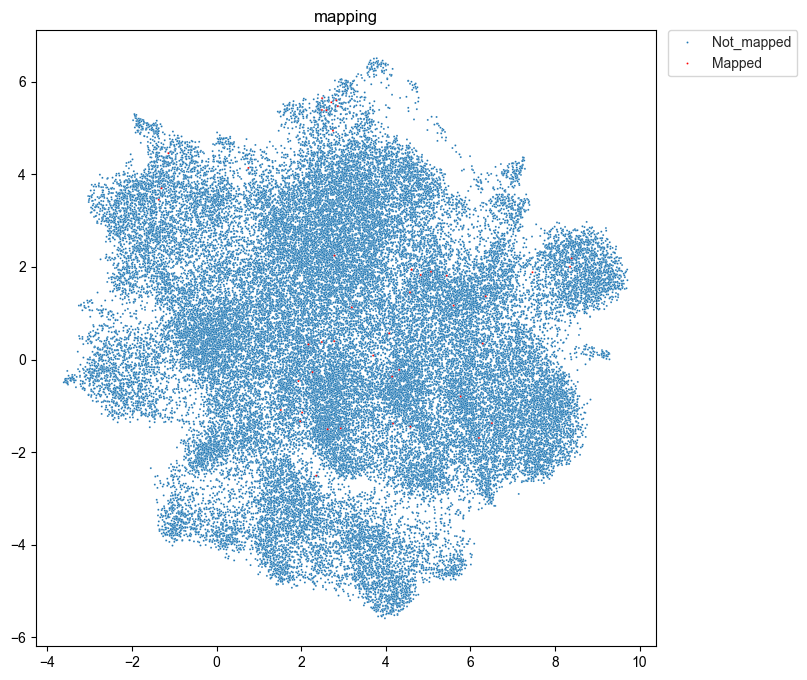

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


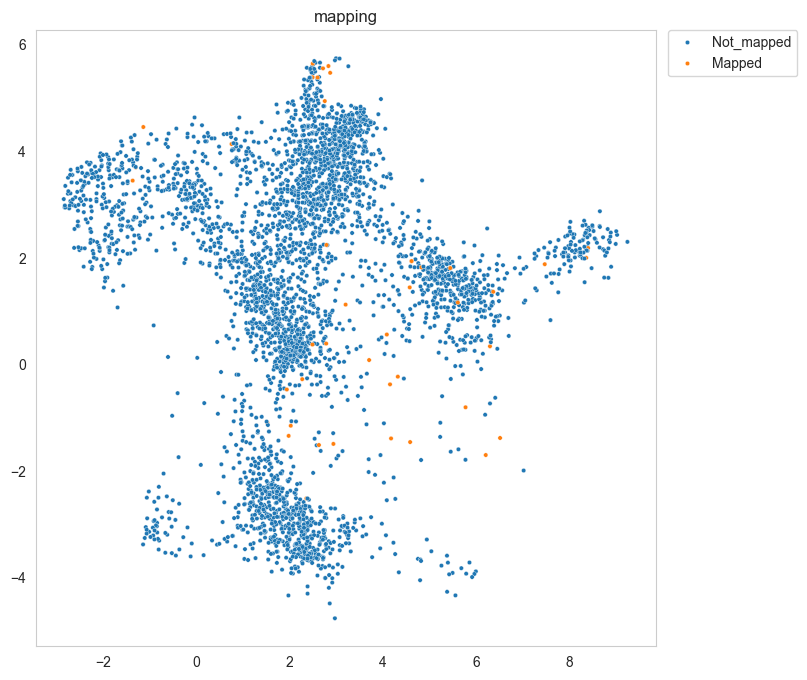

C101


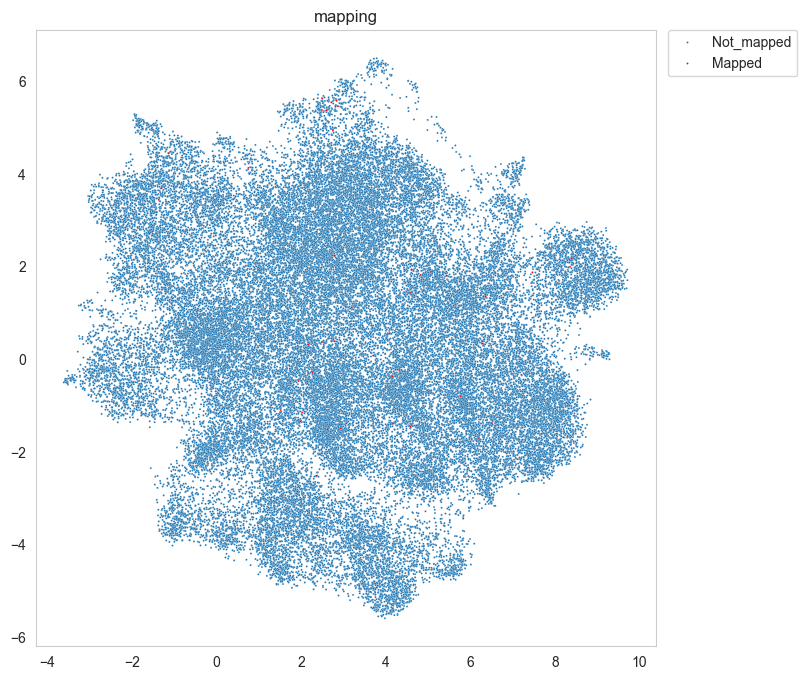

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


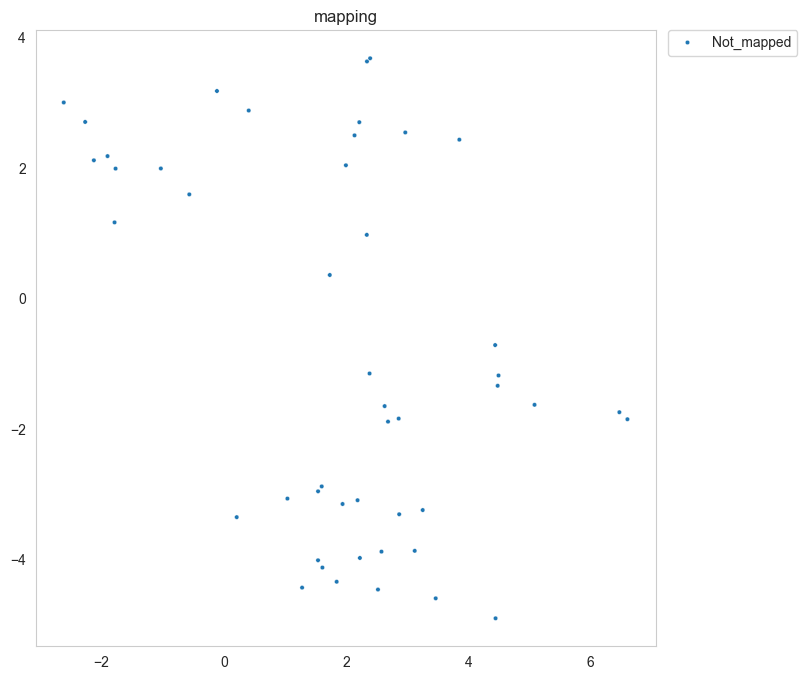

C98


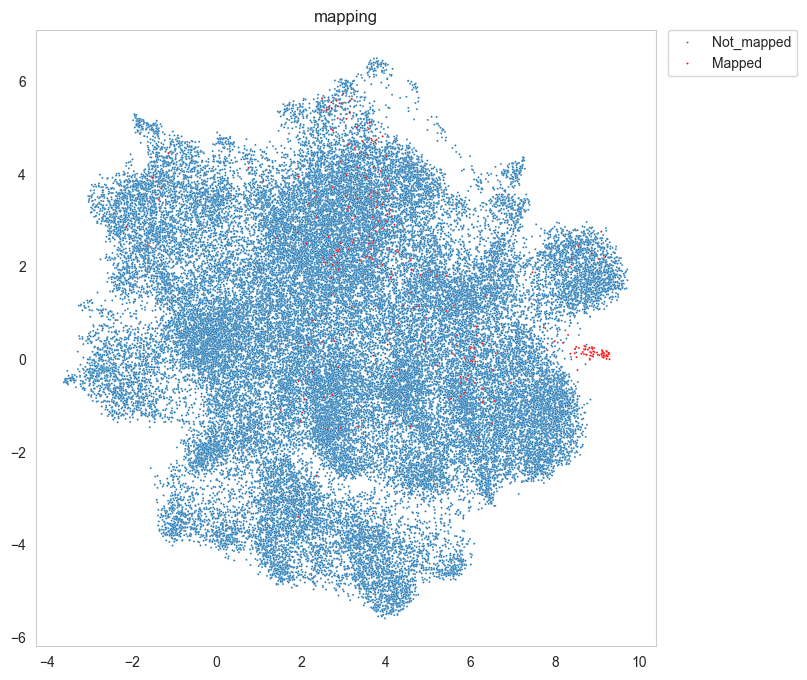

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


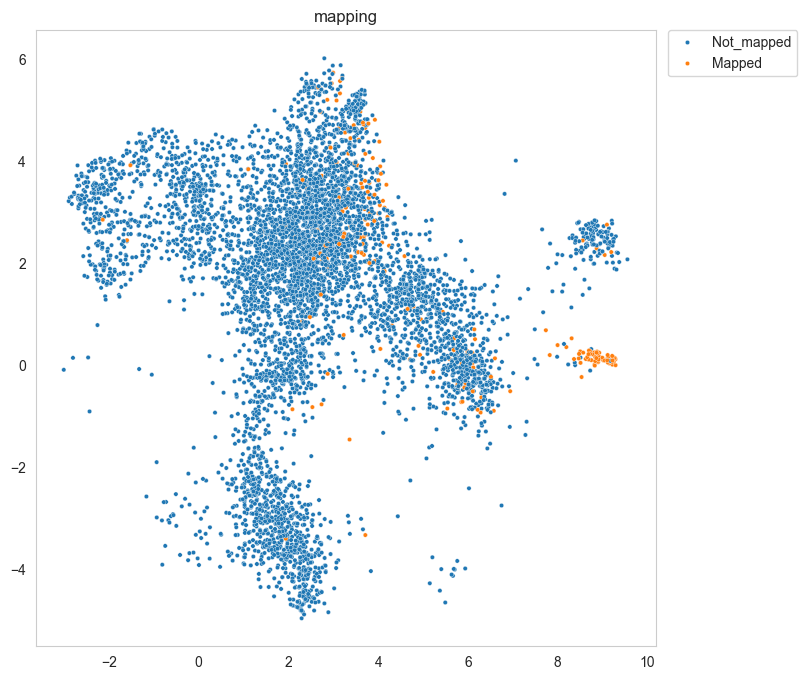

C66


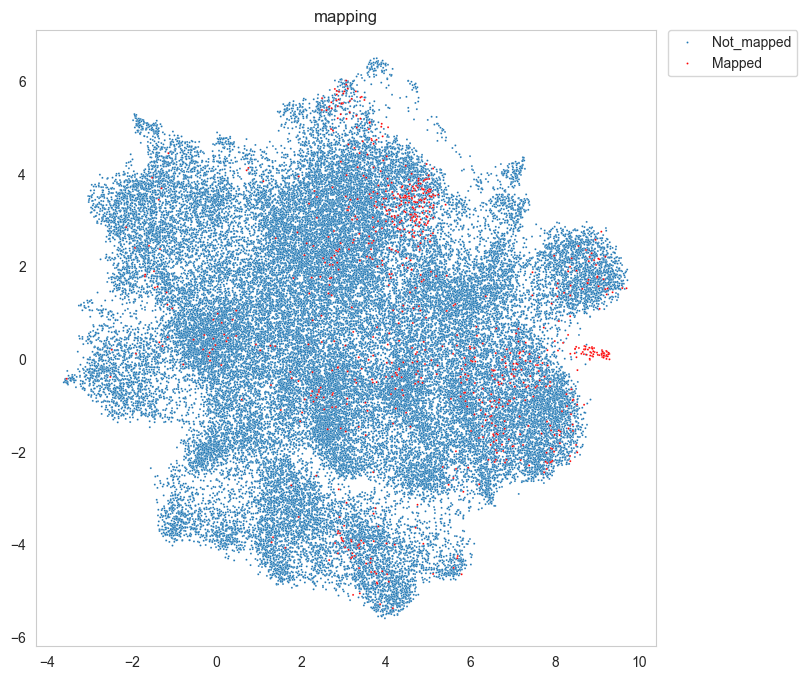

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


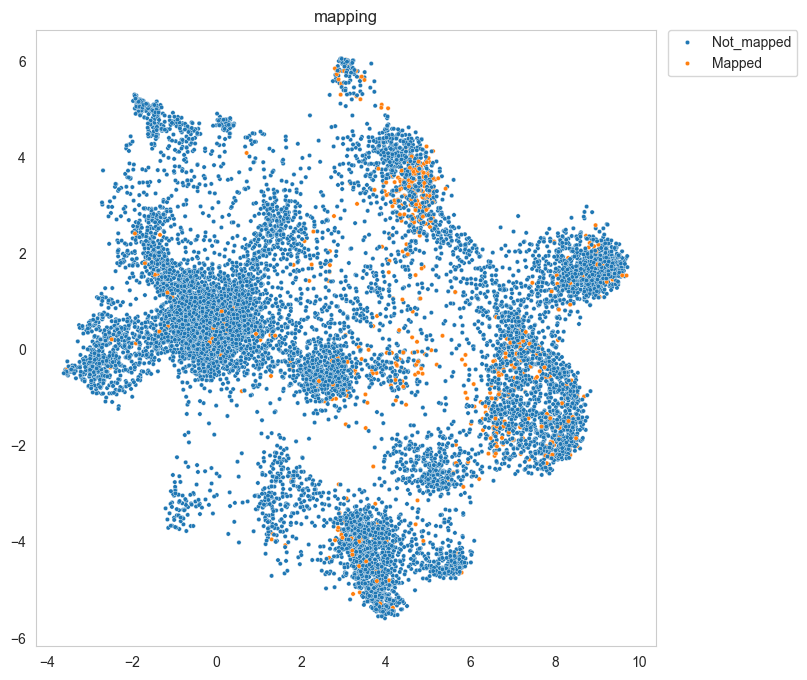

C86


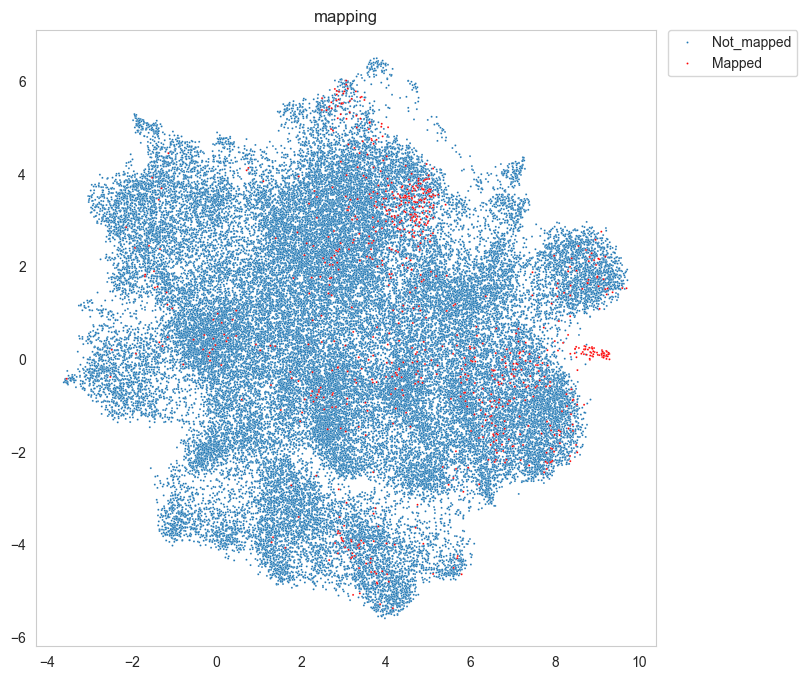

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


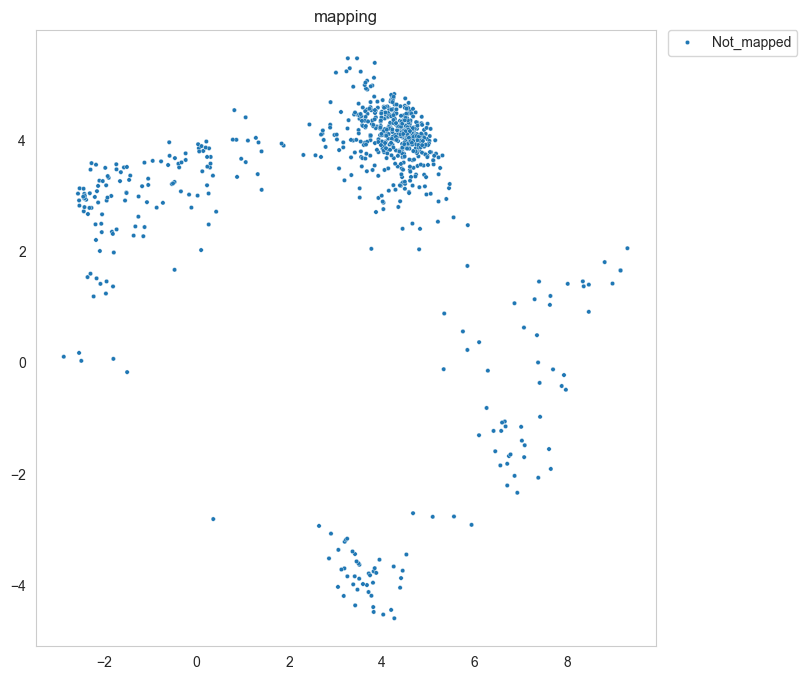

C160


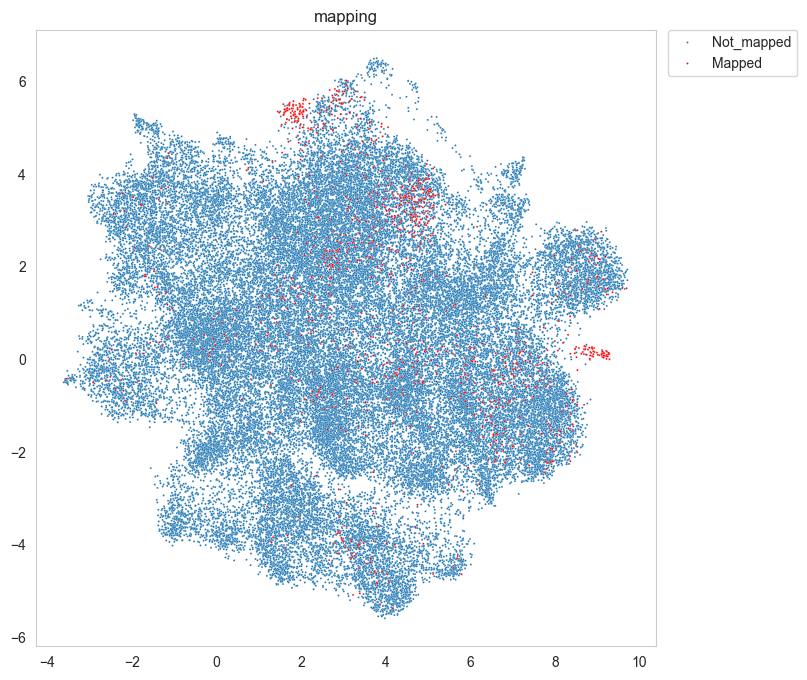

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


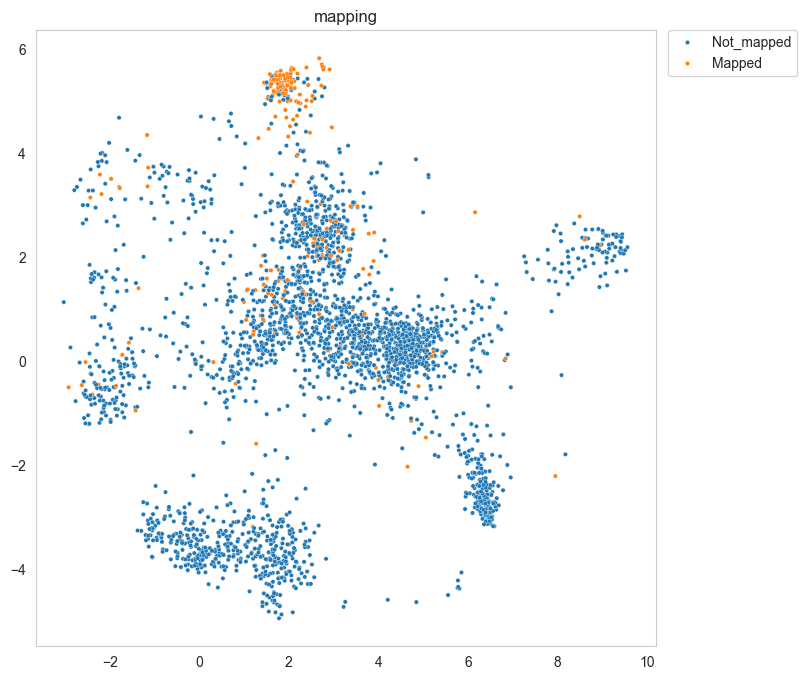

C179


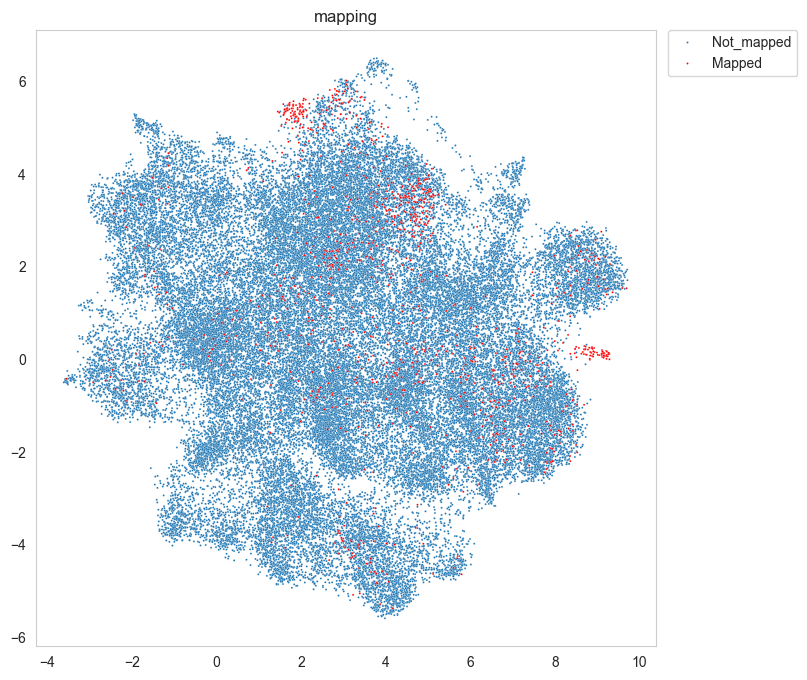

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


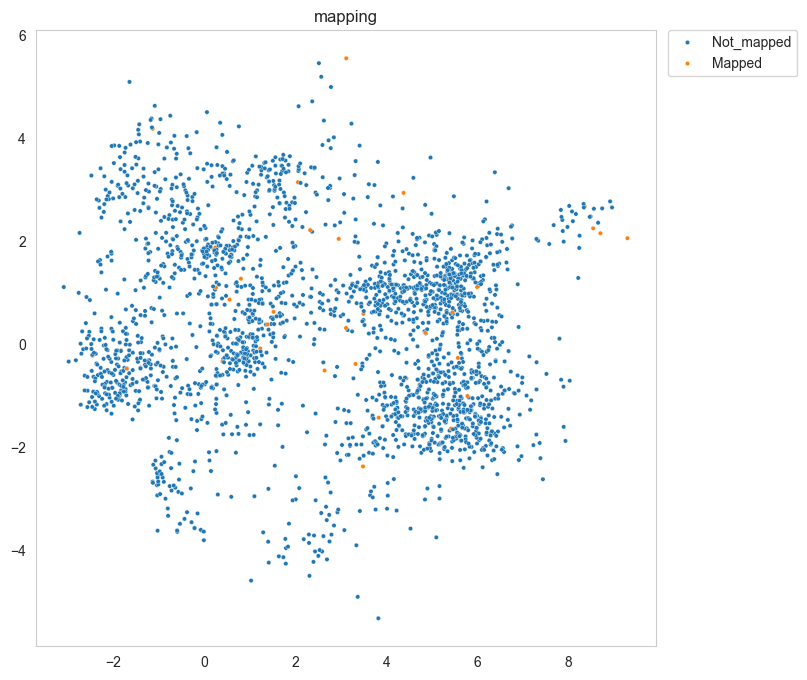

C155


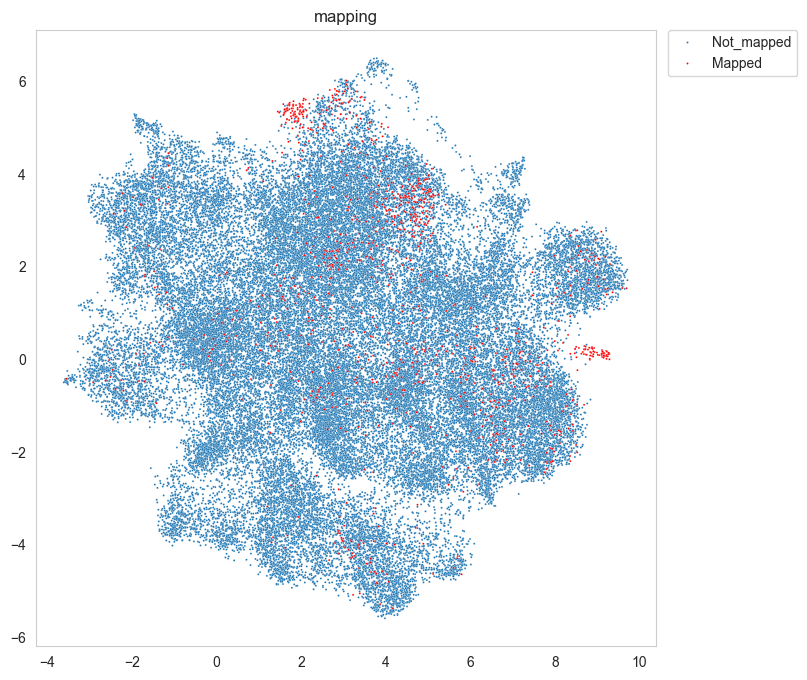

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/567777526.py:35: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


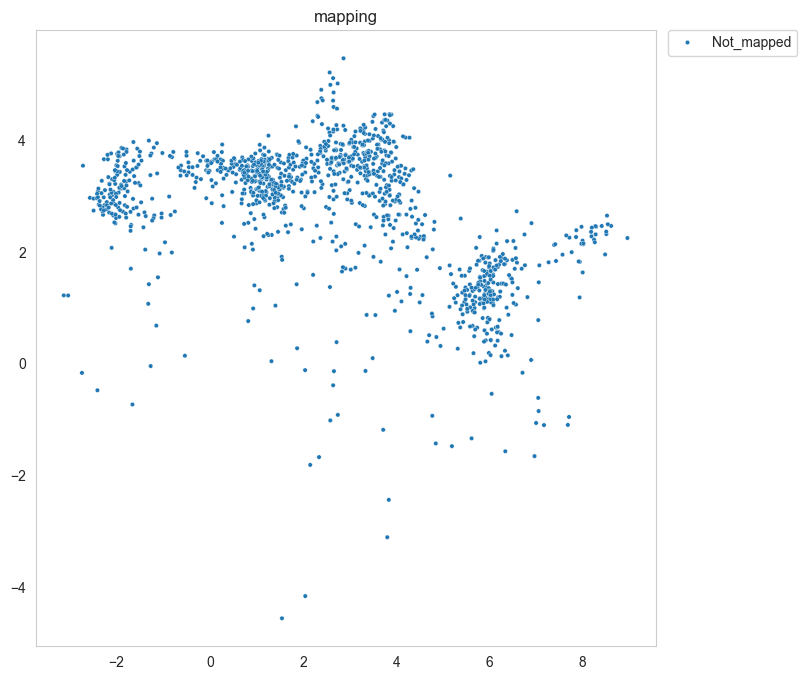

In [13]:
# How many cells are mapped
tcell_ann.obs['mapping'] ="Not_mapped"
for patient in shared_patients:
    print(patient)
    tcr_sel = tcr_sel_all[tcr_sel_all['patient']==patient]
    tcell_patient= tcell_ann[tcell_ann.obs['PatientID']==patient]
    if len(tcr_sel) > 0:
        # Create a list of patterns from the 'barcode' column
        barcode_patterns = tcr_sel['SampleID_barcode'].tolist()
        # Join patterns with "|" for regex OR operation
        combined_pattern = '|'.join(barcode_patterns)
        # Check if any pattern is present in the index of tcell_patient.obs
        matches = tcell_patient.obs['SampleID_barcode'].str.contains(combined_pattern)

        #tcell_patient.obs['mapping'] ="Not_mapped"
        tcell_patient.obs.loc[matches,"mapping"]= 'Mapped'
        
        tcell_patient_mapped = tcell_patient[tcell_patient.obs['mapping']=='Mapped']
        tcell_ann.obs.loc[tcell_ann.obs.index.isin(tcell_patient_mapped.obs.index),"mapping"]= 'Mapped'
        
        
    meta = 'mapping'
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    sns.scatterplot(x=tcell_ann[tcell_ann.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,0],y=tcell_ann[tcell_ann.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,1], hue=tcell_ann[tcell_ann.obs['mapping'] =='Not_mapped'].obs[meta],s=2)
    sns.scatterplot(x=tcell_ann[tcell_ann.obs['mapping'] =='Mapped'].obsm["X_umap"][:,0],y=tcell_ann[tcell_ann.obs['mapping'] =='Mapped'].obsm["X_umap"][:,1], hue=tcell_ann[tcell_ann.obs['mapping'] =='Mapped', ].obs[meta],s=2,palette=['red']).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()
    
    
    randomize=np.arange(len(tcell_patient.obs[meta]))
    np.random.shuffle(randomize)
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()

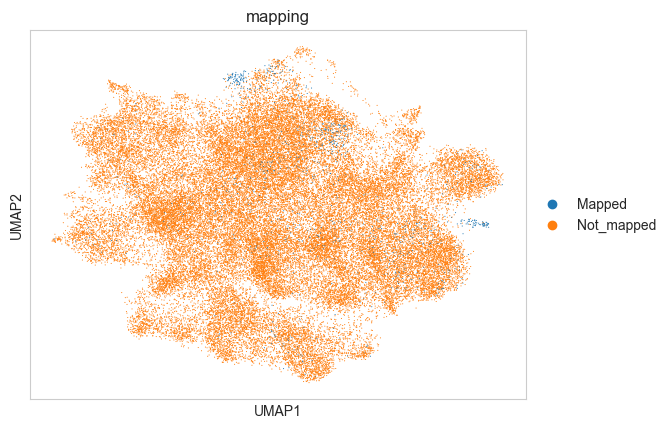

In [14]:
sc.pl.umap(tcell_ann, color=['mapping'])

In [15]:
tcell_ann_un = tcell_ann[tcell_ann.obs['mapping']=='Mapped']

In [ ]:
#tcell_ann_un.write(TCELL_ANN_MAPPED_PATH)

In [17]:
tcr_sel_all_mapped = tcr_sel_all[tcr_sel_all['SampleID_barcode'].isin(tcell_ann[tcell_ann.obs['mapping']=="Mapped"].obs["SampleID_barcode"])]

In [18]:
tcr_sel_all_mapped

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,Adaptive NT sequences,patient
0,AGTGTCAAGGCTAGGT-1,UA01AGTGTCAAGGCTAGGT-1,clonotype329,CATSASTGDSYEQYF,TGTGCCACCAGTGCCTCGACAGGGGACTCCTACGAGCAGTACTTC,3,24,1,2,7,GAGTCTGCCATCCCCAACCAGACAGCTCTTTACTTCTGTGCCACCA...,C068
1,ATTCTACGTAGCGCAA-1,UA01ATTCTACGTAGCGCAA-1,clonotype450,CASRDRGSSSGGYNEQFF,TGTGCCAGTAGGGACAGGGGTTCAAGCTCAGGGGGCTACAATGAGC...,2,19,1,2,1,CAAAAGAACCCGACAGCTTTCTATCTCTGTGCCAGTAGGGACAGGG...,C068
2,CAACCTCGTCTGCGGT-1,UA01CAACCTCGTCTGCGGT-1,clonotype186,CSVTFRGASEAFF,TGCAGCGTTACCTTTCGGGGGGCGTCTGAAGCTTTCTTT,3,29,1,1,1,ACTGTGAGCAACATGAGCCCTGAAGACAGCAGCATATATCTCTGCA...,C068
3,CATATGGAGTTCGCGC-1,UA01CATATGGAGTTCGCGC-1,clonotype452,CASSPDQGLSYNSPLHF,TGTGCCAGCAGCCCCGATCAGGGCCTCTCCTATAATTCACCCCTCC...,2,7,9,1,6,ACAGAGCAGGGGGACTCGGCCATGTATCTCTGTGCCAGCAGCCCCG...,C068
4,CCACCTAAGATGTAAC-1,UA01CCACCTAAGATGTAAC-1,clonotype136,CASSMGPSETDTQYF,TGTGCCAGTAGTATGGGACCCTCCGAGACAGATACGCAGTATTTT,5,19,1,2,3,ACATCGGCCCAAAAGAACCCGACAGCTTTCTATCTCTGTGCCAGTA...,C068
...,...,...,...,...,...,...,...,...,...,...,...,...
1596,GCGCAACCACGGCGTT-1,UA37GCGCAACCACGGCGTT-1,clonotype457,CASSLAAIGETQYF,TGTGCCAGCAGCTTAGCGGCTATAGGAGAGACCCAGTACTTC,5,7,9,2,5,ATCCAGCGCACAGAGCAGGGGGACTCGGCCATGTATCTCTGTGCCA...,C179
1598,TATGCCCGTCAGTGGA-1,UA37TATGCCCGTCAGTGGA-1,clonotype47,CASGRALSTDTQYF,TGCGCCAGTGGAAGGGCGCTCAGCACAGATACGCAGTATTTT,6,5,1,2,3,GTGAGCACCTTGGAGCTGGGGGACTCGGCCCTTTATCTTTGCGCCA...,C179
1599,TGAGCCGGTTATGTGC-1,UA37TGAGCCGGTTATGTGC-1,clonotype47,CASGRALSTDTQYF,TGCGCCAGTGGAAGGGCGCTCAGCACAGATACGCAGTATTTT,6,5,1,2,3,GTGAGCACCTTGGAGCTGGGGGACTCGGCCCTTTATCTTTGCGCCA...,C179
1600,TGTGTTTCAAACTGCT-1,UA37TGTGTTTCAAACTGCT-1,clonotype629,CASSPTSGDNYGYTF,TGTGCCAGCAGCCCCACCTCCGGAGATAACTATGGCTACACCTTC,1,11,2,1,2,CAGCCTGCAAAGCTTGAGGACTCGGCCGTGTATCTCTGTGCCAGCA...,C179


In [19]:
tcr_sel_all_mapped = pd.merge(tcr_sel_all_mapped,tcell_ann.obs,on='SampleID_barcode', how='left')

In [20]:
tcr_sel_all_mapped

,barcode,SampleID_barcode,raw_clonotype_id,cdr3,cdr3_nt,#clones,V1,V2,J1,J2,...,leiden_0.15,B_doublet,Myeloid_doublet,Macrophage_doublet,Monocyte_doublet,Epithelial_doublet,Fibroblast_doublet,plasma_doublet2,if_doublet,mapping
0,AGTGTCAAGGCTAGGT-1,UA01AGTGTCAAGGCTAGGT-1,clonotype329,CATSASTGDSYEQYF,TGTGCCACCAGTGCCTCGACAGGGGACTCCTACGAGCAGTACTTC,3,24,1,2,7,...,0,False,False,False,False,False,False,False,False,Mapped
1,ATTCTACGTAGCGCAA-1,UA01ATTCTACGTAGCGCAA-1,clonotype450,CASRDRGSSSGGYNEQFF,TGTGCCAGTAGGGACAGGGGTTCAAGCTCAGGGGGCTACAATGAGC...,2,19,1,2,1,...,0,False,False,False,False,False,False,False,False,Mapped
2,CAACCTCGTCTGCGGT-1,UA01CAACCTCGTCTGCGGT-1,clonotype186,CSVTFRGASEAFF,TGCAGCGTTACCTTTCGGGGGGCGTCTGAAGCTTTCTTT,3,29,1,1,1,...,0,False,False,False,False,False,False,False,False,Mapped
3,CATATGGAGTTCGCGC-1,UA01CATATGGAGTTCGCGC-1,clonotype452,CASSPDQGLSYNSPLHF,TGTGCCAGCAGCCCCGATCAGGGCCTCTCCTATAATTCACCCCTCC...,2,7,9,1,6,...,0,False,False,False,False,False,False,False,False,Mapped
4,CCACCTAAGATGTAAC-1,UA01CCACCTAAGATGTAAC-1,clonotype136,CASSMGPSETDTQYF,TGTGCCAGTAGTATGGGACCCTCCGAGACAGATACGCAGTATTTT,5,19,1,2,3,...,0,False,False,False,True,False,False,False,True,Mapped
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1129,GCGCAACCACGGCGTT-1,UA37GCGCAACCACGGCGTT-1,clonotype457,CASSLAAIGETQYF,TGTGCCAGCAGCTTAGCGGCTATAGGAGAGACCCAGTACTTC,5,7,9,2,5,...,0,False,False,False,False,False,False,False,False,Mapped
1130,TATGCCCGTCAGTGGA-1,UA37TATGCCCGTCAGTGGA-1,clonotype47,CASGRALSTDTQYF,TGCGCCAGTGGAAGGGCGCTCAGCACAGATACGCAGTATTTT,6,5,1,2,3,...,0,False,True,True,False,False,False,False,True,Mapped
1131,TGAGCCGGTTATGTGC-1,UA37TGAGCCGGTTATGTGC-1,clonotype47,CASGRALSTDTQYF,TGCGCCAGTGGAAGGGCGCTCAGCACAGATACGCAGTATTTT,6,5,1,2,3,...,0,False,True,True,False,False,False,False,True,Mapped
1132,TGTGTTTCAAACTGCT-1,UA37TGTGTTTCAAACTGCT-1,clonotype629,CASSPTSGDNYGYTF,TGTGCCAGCAGCCCCACCTCCGGAGATAACTATGGCTACACCTTC,1,11,2,1,2,...,0,False,False,False,False,False,False,False,False,Mapped


In [21]:
tcr_sel_all_mapped.to_csv(TCR_SEL_ALL_MAPPED_PATH, index=False)

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:3: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_ann_shared.obs['mapping'] ="Not_mapped"


C068


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


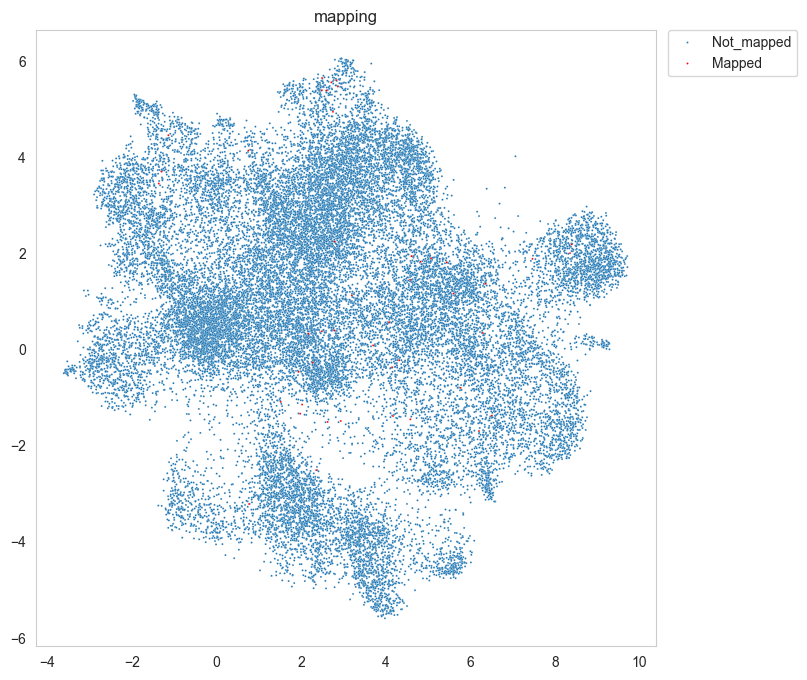

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


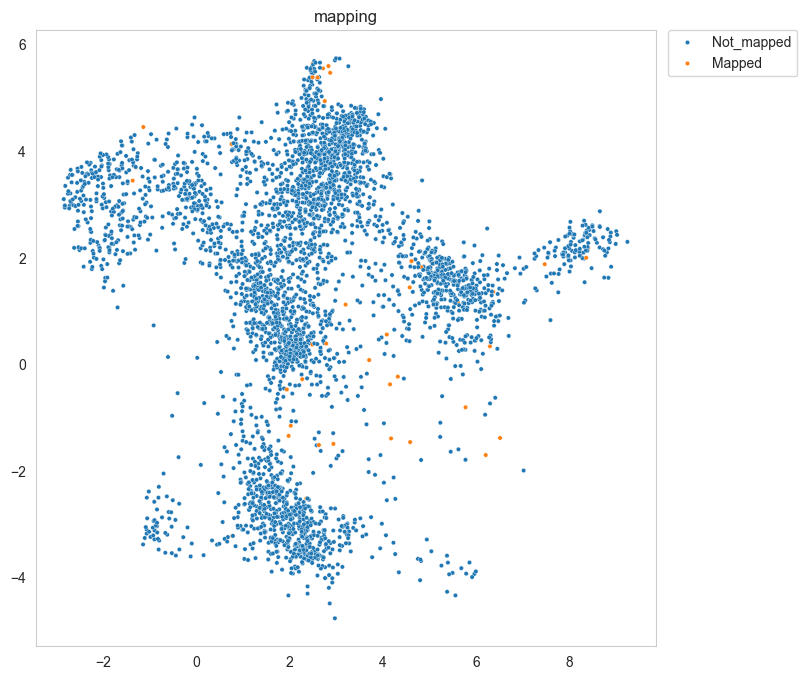

C101


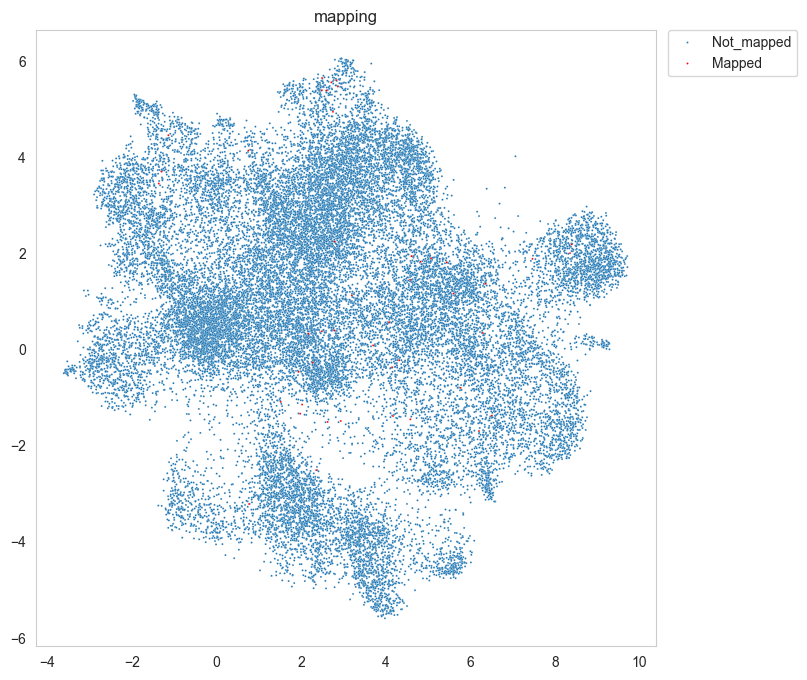

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


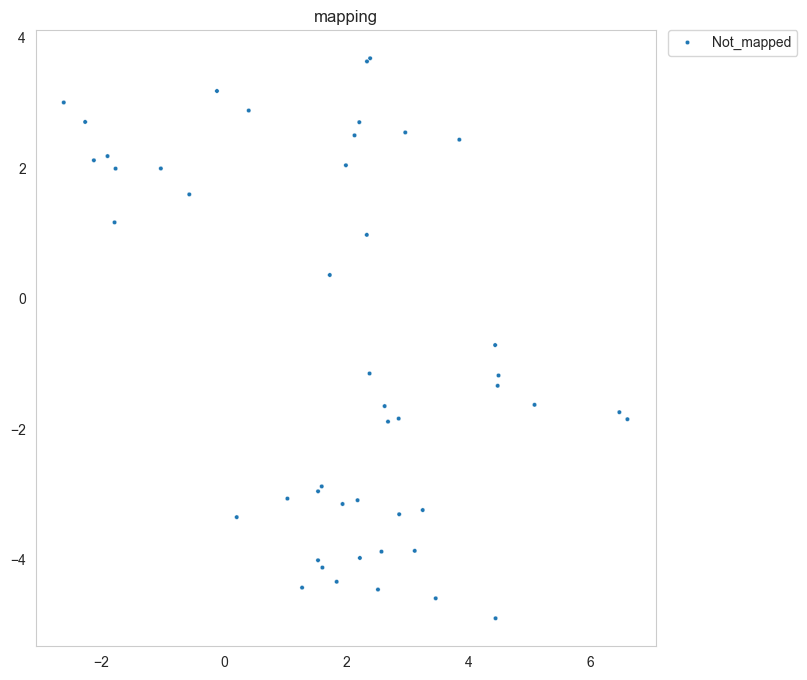

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


C98


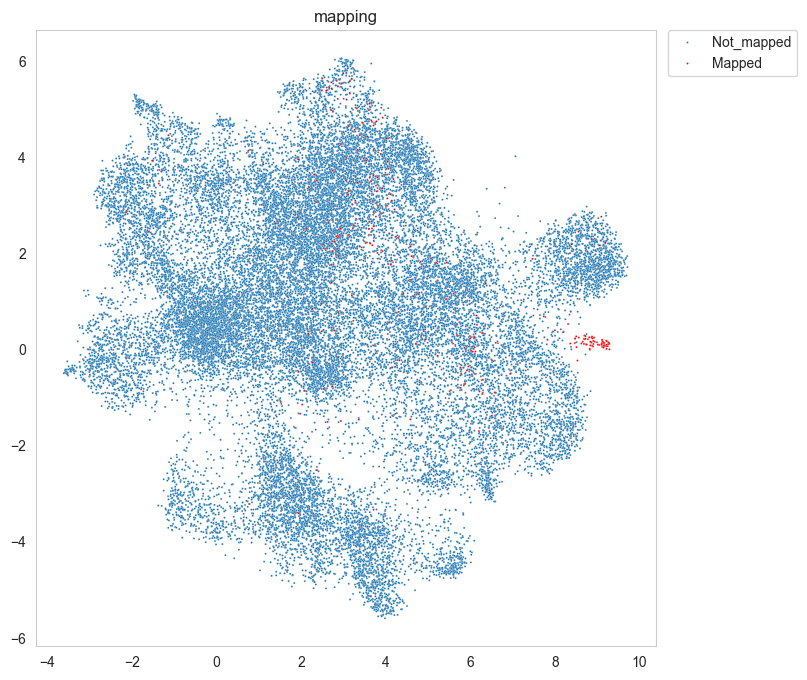

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


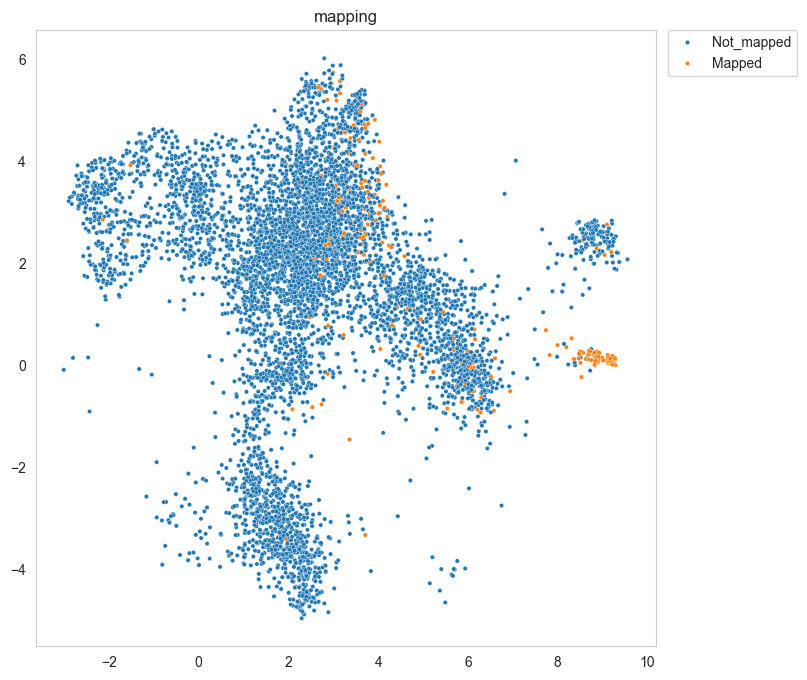

C66


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


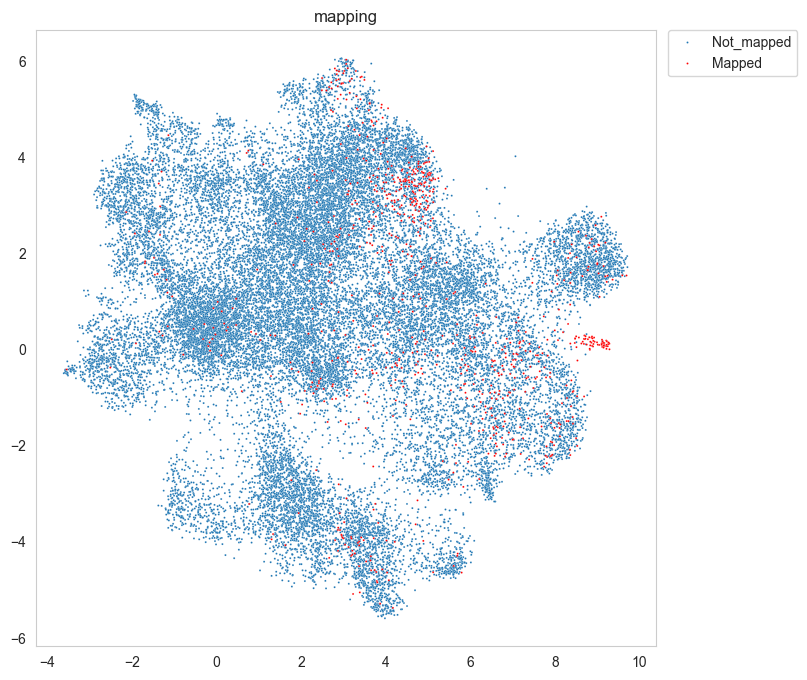

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


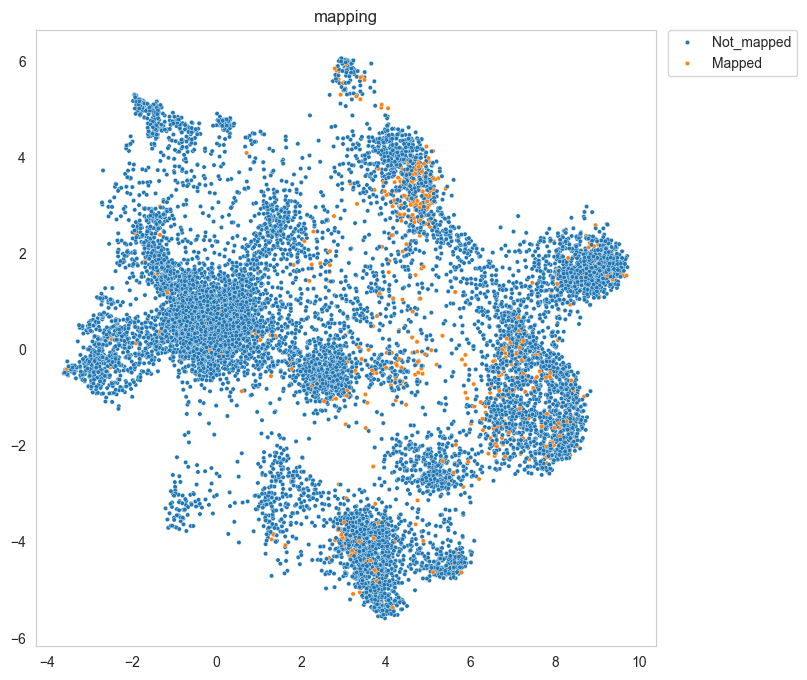

C86


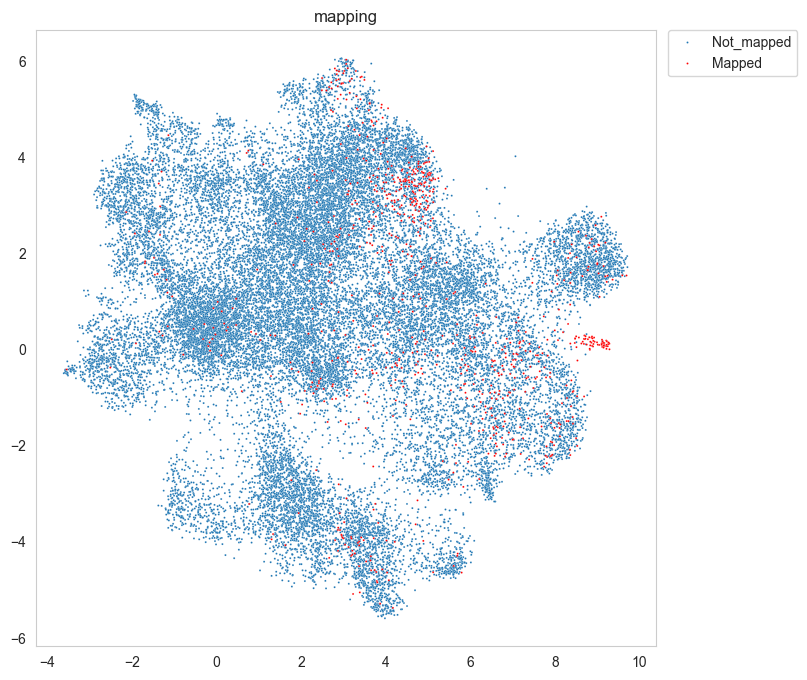

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


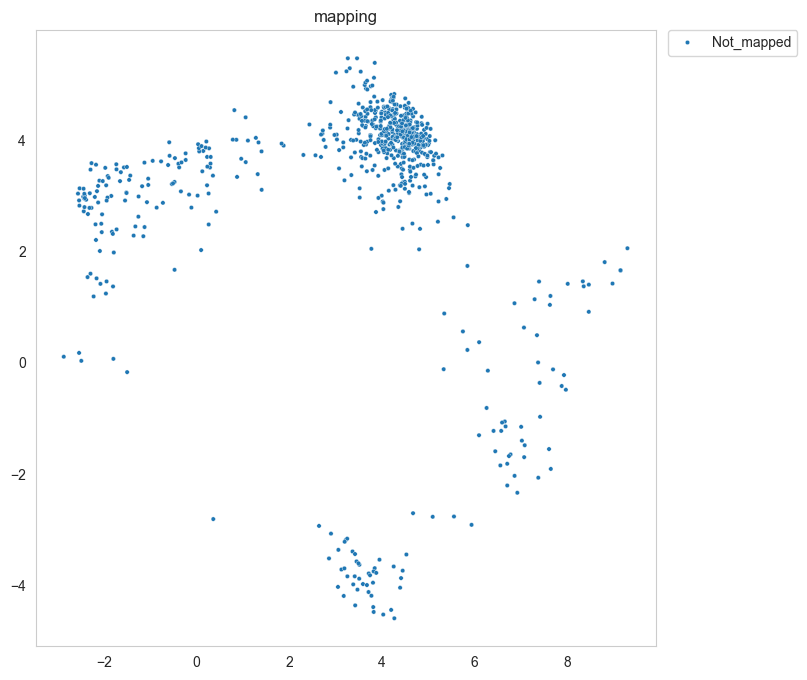

C160


/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


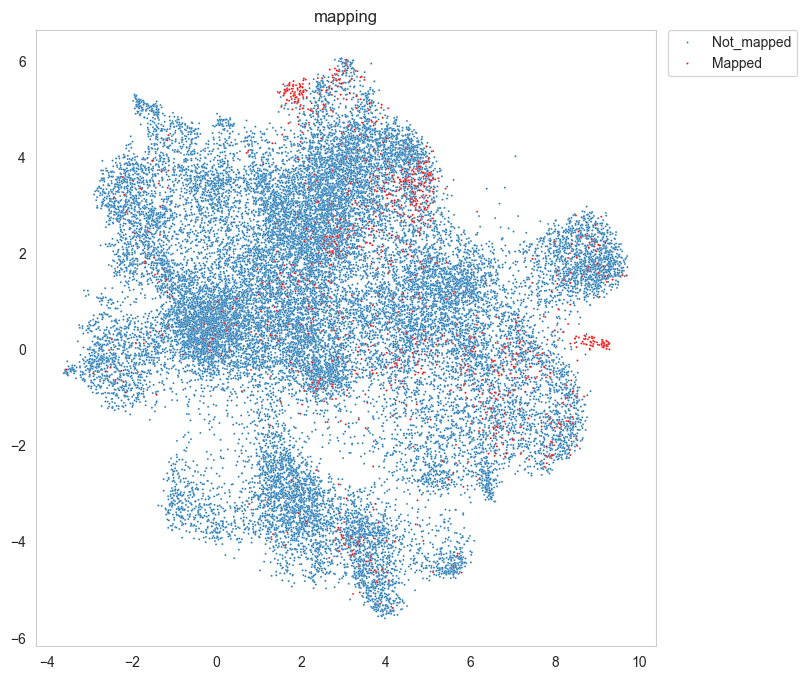

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


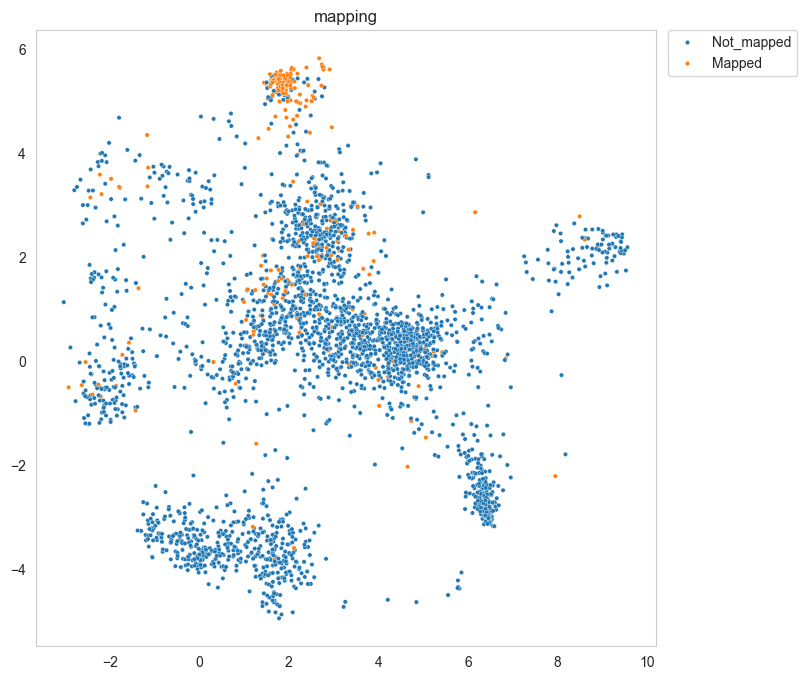

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:16: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  tcell_patient.obs['mapping'] ="Not_mapped"


C179


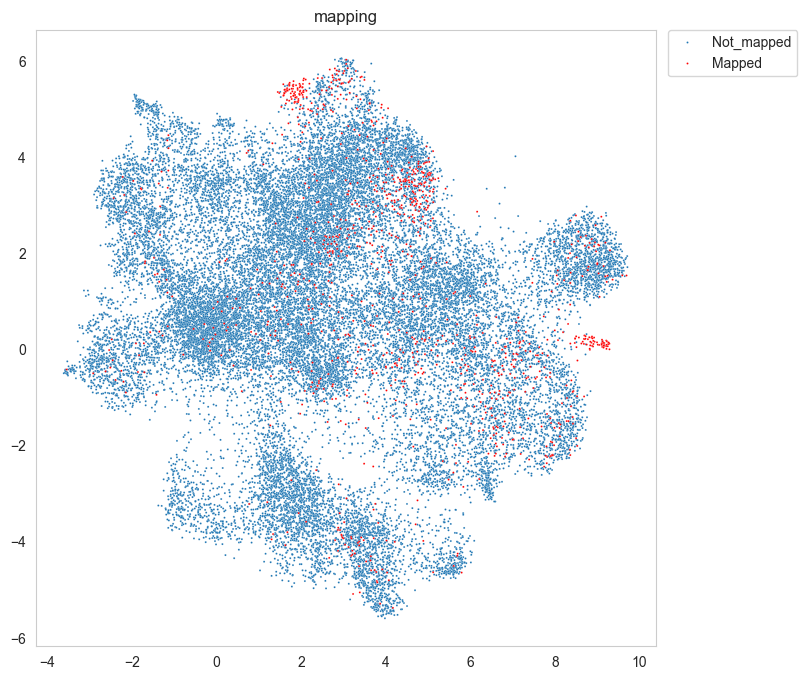

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


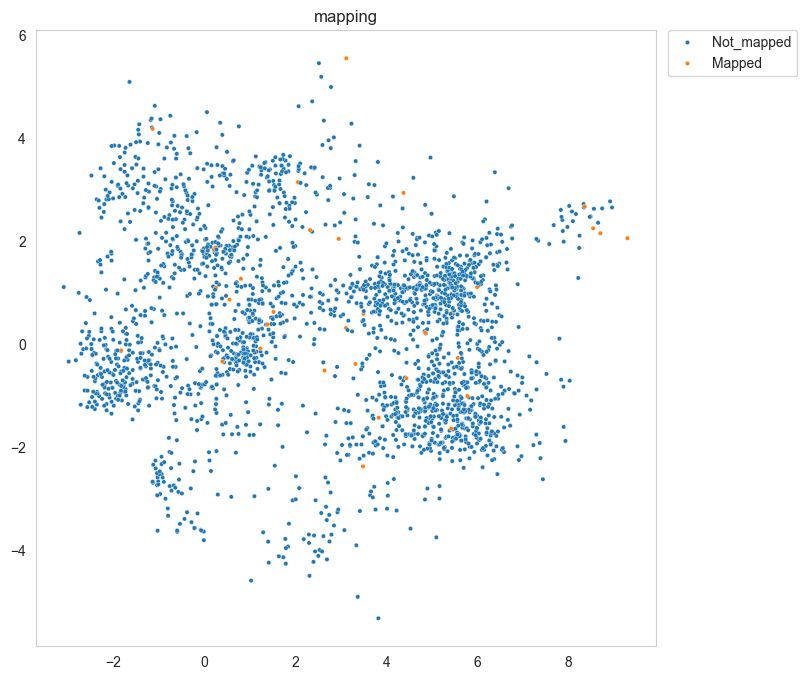

C155


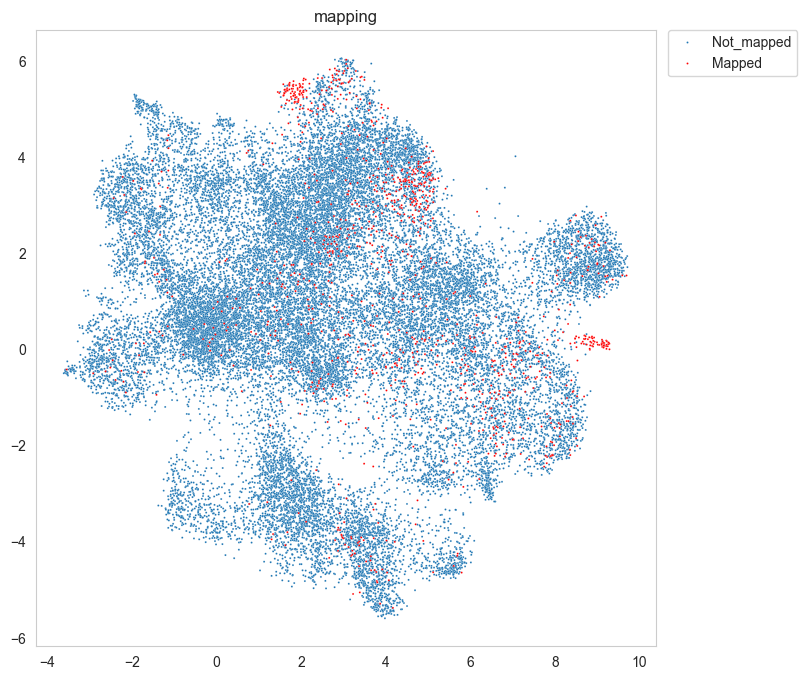

/var/folders/08/j2wbrltj24qcpm1vfvrsrkgh0000gq/T/ipykernel_7340/3830868714.py:36: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)


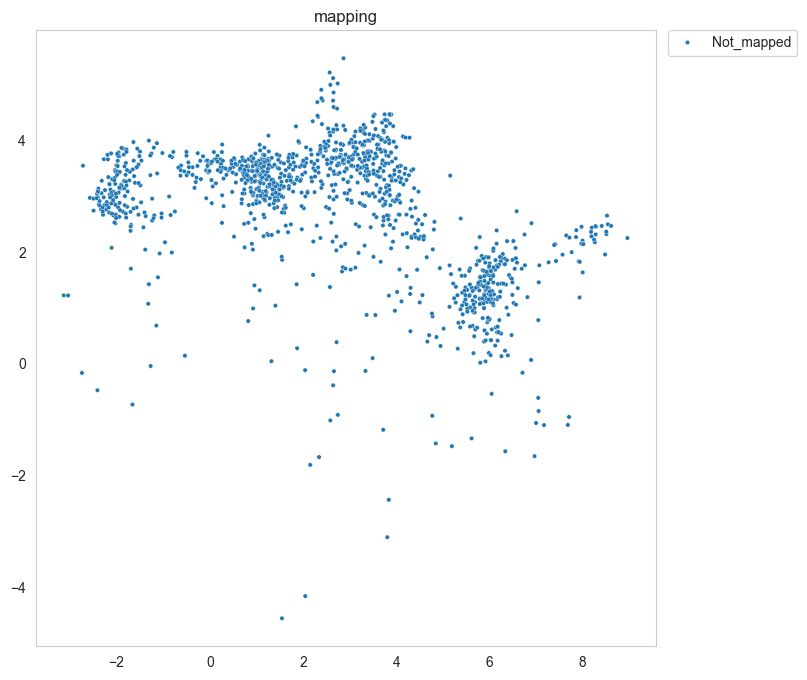

In [22]:
# How many cells are mapped

tcell_ann_shared.obs['mapping'] ="Not_mapped"
for patient in shared_patients:
    print(patient)
    tcr_sel = tcr_sel_all[tcr_sel_all['patient']==patient]
    tcell_patient= tcell_ann_shared[tcell_ann_shared.obs['PatientID']==patient]
    if len(tcr_sel) > 0:
        # Create a list of patterns from the 'barcode' column
        barcode_patterns = tcr_sel['barcode'].tolist()
        # Join patterns with "|" for regex OR operation
        combined_pattern = '|'.join(barcode_patterns)
        # Check if any pattern is present in the index of tcell_patient.obs
        matches = tcell_patient.obs.index.str.contains(combined_pattern)

        tcell_patient.obs['mapping'] ="Not_mapped"
        tcell_patient.obs.loc[matches,"mapping"]= 'Mapped'
        
        tcell_patient_mapped = tcell_patient[tcell_patient.obs['mapping']=='Mapped']
        tcell_ann_shared.obs.loc[tcell_ann_shared.obs.index.isin(tcell_patient_mapped.obs.index),"mapping"]= 'Mapped'
        
        
    meta = 'mapping'
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    sns.scatterplot(x=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,0],y=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Not_mapped'].obsm["X_umap"][:,1], hue=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Not_mapped'].obs[meta],s=2)
    sns.scatterplot(x=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Mapped'].obsm["X_umap"][:,0],y=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Mapped'].obsm["X_umap"][:,1], hue=tcell_ann_shared[tcell_ann_shared.obs['mapping'] =='Mapped', ].obs[meta],s=2,palette=['red']).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()
    
    
    randomize=np.arange(len(tcell_patient.obs[meta]))
    np.random.shuffle(randomize)
    fig, ax = plt.subplots(figsize=(8,8))
    sns.set_style("whitegrid", {'axes.grid' : False})
    scatter=sns.scatterplot(x=tcell_patient.obsm["X_umap"][:,0][randomize],y=tcell_patient.obsm["X_umap"][:,1][randomize], hue=tcell_patient.obs[meta][randomize],s=10).set(title=meta)
    plt.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
    plt.show()

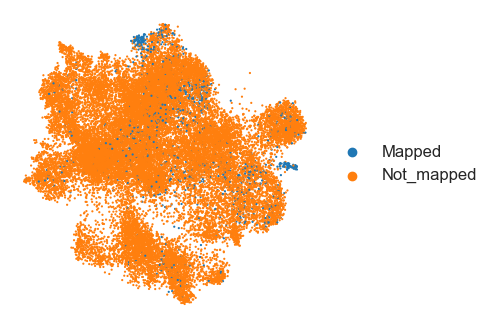

In [23]:
import matplotlib as mpl
# Update your existing rcParams
mpl.rcParams.update({
    'font.size': 12,
    'svg.fonttype': 'none',
    'font.family': 'Arial',
    'figure.figsize': (4,4)  # Set default figure size to 6×4 inches
})
mpl.rcParams['axes.titlesize'] = 12
mpl.rcParams['xtick.labelsize'] = 12  # Colorbar tick label size 
mpl.rcParams['ytick.labelsize'] = 12  # Colorbar tick label size

sc.pl.umap(tcell_ann_shared, color=['mapping'], frameon=False,
    size=10,  # Adjust this value to make the dots bigger (default is 120)
    show=False, title = '')  # We will save it manually)


# Save the plot manually with DPI 300
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_mapped_donor.pdf', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_mapped_donor.png', dpi=300, bbox_inches='tight', transparent=True)
plt.savefig(FIGURES_DIR / 'umap_clusters_dpi300_mapped_donor.svg', dpi=300, bbox_inches='tight', transparent=True)
# Show the plot (optional, if you want to see it before saving)
plt.show()

In [24]:
tcell_ann_shared

AnnData object with n_obs × n_vars = 28904 × 38012
    obs: 'PatientID', 'SampleID', 'FreshorFrozen', 'Days_post-Transplant', 'Tissue_Location', 'LPorIE', 'Enrichment Method', 'Pathological_grade_of_GVHD', 'Grade_num', 'GVHD_Grade_1', 'GVHD_Grade_2', 'GVHD_Grade_3', 'Transplant_Conditioning', 'Gender', 'DoT', 'Time_1stGVHD', 'Donor', 'Disease', 'GVHD_Prophylaxis_Regimen', 'Dates_from_Transplantation', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'is_doublet', 'leiden', 'leiden_0.15', 'B_doublet', 'Myeloid_doublet', 'Macrophage_doublet', 'Monocyte_doublet', 'Epithelial_doublet', 'Fibroblast_doublet', 'plasma_doublet2', 'if_doublet', 'mapping'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'
    uns: 'B_doublet_colors', 'Epithelial_doublet_colors', 'Fibroblast_doublet_colors', 'Macrophage_doub

In [25]:
tcell_ann.write(TCELL_ANN_MAPPED_PATH)